# K mean Clustering - Customer Dataset:

## Abstract:
   A key challenge for e-commerce businesses is to analyze the trend in the market to increase their sales. The trend can be easily observed if the companies can group the customers; based on their activity on the e-
commerce site. This grouping can be done by applying different criteria like previous orders, mostly searched brands and so on.

# Problem Statement:
  Given the e-commerce data, use k-means clustering algorithm to cluster customers with similar interest.
  Dataset Information:
             The data was collected from a well known e-commerce website over a period of time based on the     customer’s search profile.

### Import the libraries:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#warnings.filterwarnings('ignore')

### Load the customer dataset

In [2]:
df=pd.read_excel('cust_data.xlsx')
df.head()

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
0,1,M,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,F,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,3,M,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,F,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,NaN,10,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,1,1


### Check the datatypes

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Cust_ID                 30000 non-null  int64 
 1   Gender                  27276 non-null  object
 2   Orders                  30000 non-null  int64 
 3   Jordan                  30000 non-null  int64 
 4   Gatorade                30000 non-null  int64 
 5   Samsung                 30000 non-null  int64 
 6   Asus                    30000 non-null  int64 
 7   Udis                    30000 non-null  int64 
 8   Mondelez International  30000 non-null  int64 
 9   Wrangler                30000 non-null  int64 
 10  Vans                    30000 non-null  int64 
 11  Fila                    30000 non-null  int64 
 12  Brooks                  30000 non-null  int64 
 13  H&M                     30000 non-null  int64 
 14  Dairy Queen             30000 non-null  int64 
 15  Fe

### Missing values:
The missing values are converted to default. We use the following functions to identify these missing values. There are two methods to detect missing data:

.isnull()
.notnull()
The output is a boolean value indicating whether the value that is passed into the argument is in fact missing data.

In [4]:
missing_data = df.isnull()
missing_data.head(5)

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


## Count missing values in each column:
   Using a for loop in Python, we can find out the number of missing values in each column."True" represents a missing value, "False" means the value is present in the dataset. In the body of the for loop the method ".value_counts()" counts the number of "True" values.

In [5]:
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")   

Cust_ID
False    30000
Name: Cust_ID, dtype: int64

Gender
False    27276
True      2724
Name: Gender, dtype: int64

Orders
False    30000
Name: Orders, dtype: int64

Jordan
False    30000
Name: Jordan, dtype: int64

Gatorade
False    30000
Name: Gatorade, dtype: int64

Samsung
False    30000
Name: Samsung, dtype: int64

Asus
False    30000
Name: Asus, dtype: int64

Udis
False    30000
Name: Udis, dtype: int64

Mondelez International
False    30000
Name: Mondelez International, dtype: int64

Wrangler
False    30000
Name: Wrangler, dtype: int64

Vans
False    30000
Name: Vans, dtype: int64

Fila
False    30000
Name: Fila, dtype: int64

Brooks
False    30000
Name: Brooks, dtype: int64

H&M
False    30000
Name: H&M, dtype: int64

Dairy Queen
False    30000
Name: Dairy Queen, dtype: int64

Fendi
False    30000
Name: Fendi, dtype: int64

Hewlett Packard
False    30000
Name: Hewlett Packard, dtype: int64

Pladis
False    30000
Name: Pladis, dtype: int64

Asics
False    30000
Name: Asics, dty

### Drop the null values:'
Drop those. null values from gender variable in dataset.

In [6]:
df.dropna(inplace = True)
df.head()
df.shape

(27276, 38)

### LabelEncoder
It convert characterical object into numerical data.

In [7]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
df['Gender']= LE.fit_transform(df.Gender)
df.head()

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,0,4,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


In [8]:
mydata = df # Assigning to new variable
mydata.head()

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,0,4,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


## Pairplot:
   It check  the linearity of the dataset variables.

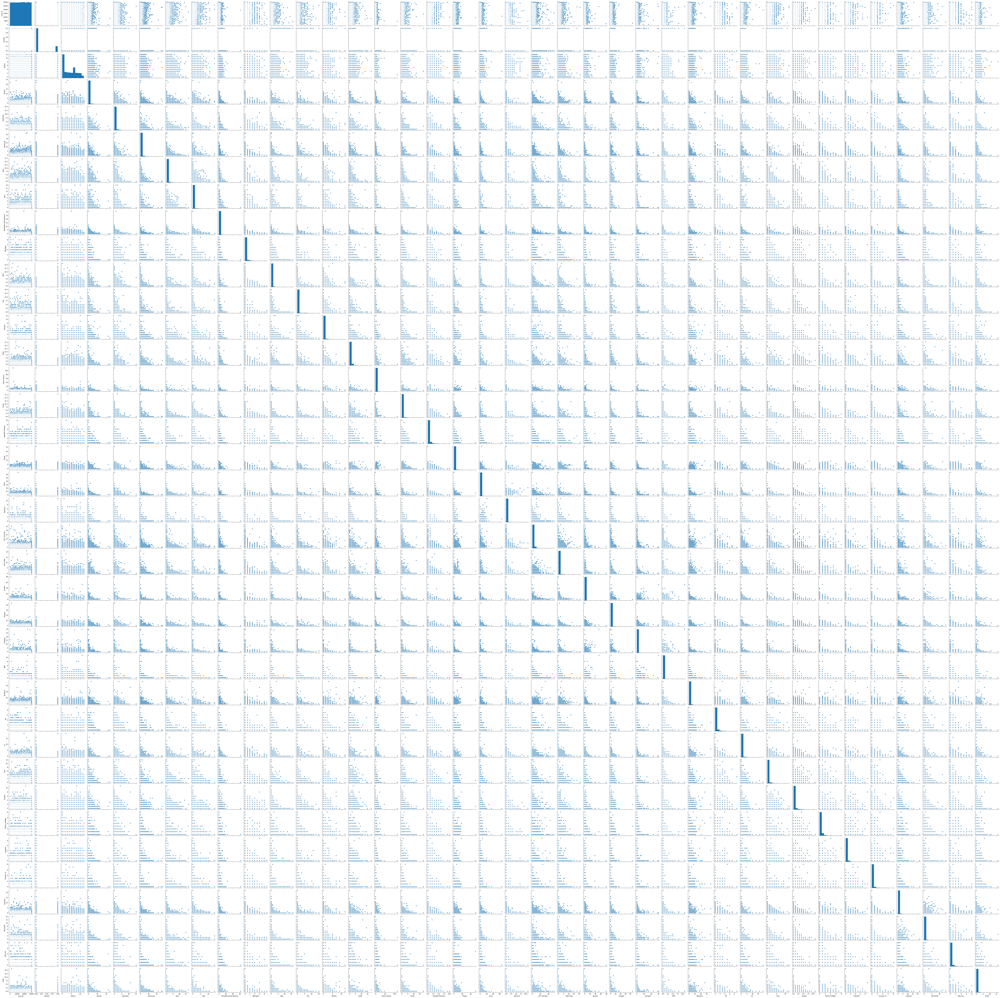

In [9]:
sns.pairplot(mydata)

## K-mean Clustering:
   The goal of Kmean clustering is to minimize the intra cluster distance and maximize intercluster distances.Divide data into K overlapping clusters wihtout any internal structure.K Means is an iterative process. Once all data points are assigned to its centroid (based on the shortest Euclidean distance), the centroids are recalculated and this process continues till the centroids stop re-shifting, i.e. The new and previous centroid numbers didn’t change significantly. In this dataset we have different brands but to increase the sale we muct group the customer according to the similarities We use K mean clustering to group the customer.

In [9]:
#Import the Kmeans
from sklearn.cluster import KMeans

## Determine K value:
K value is number of clusters.It is difficult to find the k value.

In [10]:
Km_cluster=KMeans(3)

### Fit the model:

In [11]:
Km_cluster.fit(mydata)

KMeans(n_clusters=3)

### Copy the dataset:
   Copy the original dataset because not want to do any change in original dataset.

In [12]:
my_Cluster=mydata.copy()

### Dataset labelled with groups:

In [13]:
my_Cluster['KM_Group']=Km_cluster.predict(my_Cluster)
my_Cluster

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft,KM_Group
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
1,2,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,2
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,2
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
5,6,0,4,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
29996,29997,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
29997,29998,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
29998,29999,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Defa

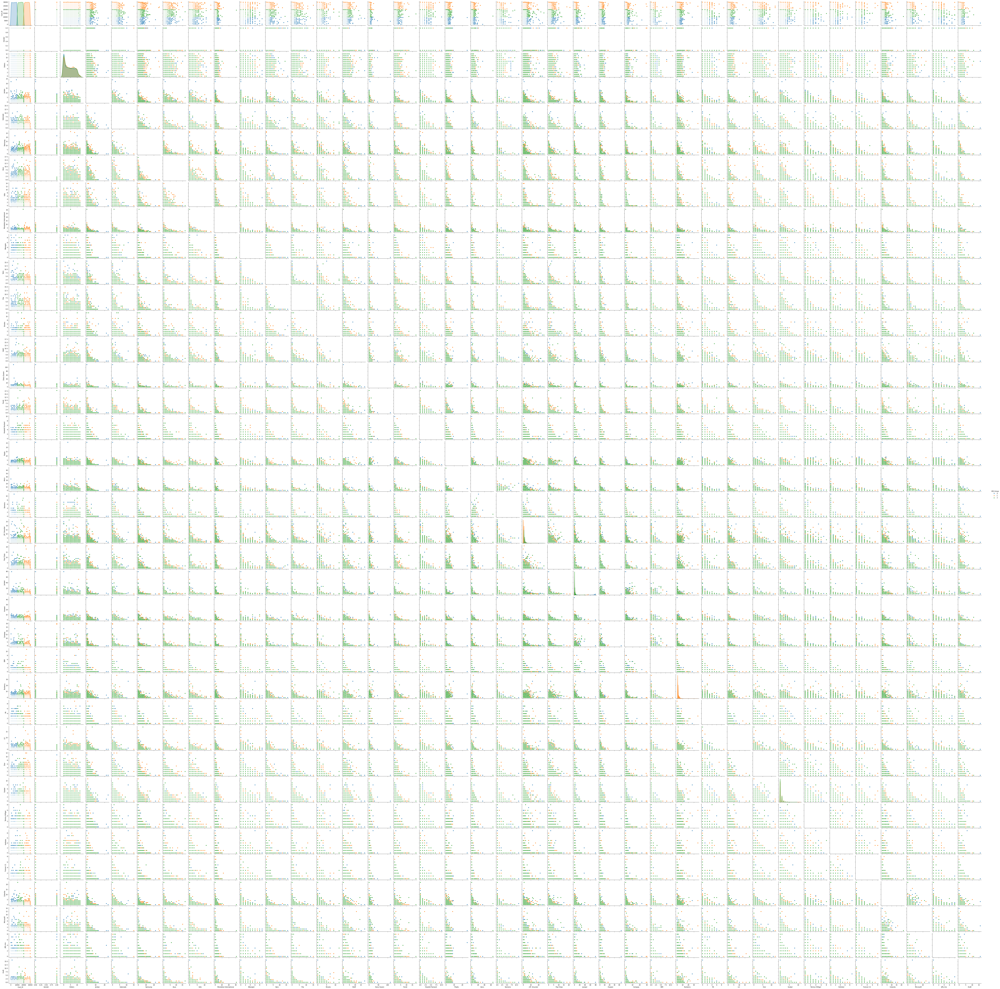

In [15]:
sns.pairplot(data=my_Cluster,hue='KM_Group')

## Normalize the dataset:

In [14]:
from sklearn import preprocessing
x_scaled=preprocessing.scale(mydata)
x_scaled

array([[-1.73589133,  2.05506353,  0.76948834, ..., -0.2636613 ,
        -0.22360514, -0.18388622],
       [-1.7357758 , -0.48660296, -1.18540419, ..., -0.2636613 ,
        -0.22360514, -0.18388622],
       [-1.73566027,  2.05506353,  0.76948834, ...,  1.9215789 ,
        -0.22360514, -0.18388622],
       ...,
       [ 1.72968737,  2.05506353, -1.18540419, ..., -0.2636613 ,
        -0.22360514, -0.18388622],
       [ 1.7298029 ,  2.05506353, -1.18540419, ..., -0.2636613 ,
        -0.22360514, -0.18388622],
       [ 1.72991843, -0.48660296, -0.3475931 , ..., -0.2636613 ,
        -0.22360514, -0.18388622]])

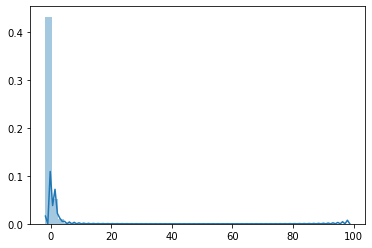

In [15]:
sns.distplot(x_scaled)

# Elbow method:
   It is used determine the optimal value of K.The idea here is to plot the total inertia score, for different values of K and identify K beyond which the inertia doesn’t change muchIt involues running algorithm multiple times over a loop with increasing number of cluster.It gives number of cluster.Inertia is defined as the sum of squared distances of data points to their closest cluster center (centroid). Lower the distance better the compactness of the clusters. However, inertia decreases as we keep increasing the value of K. An algorithm with two clusters will always have a higher inertia score than the one with four clusters and so on. This is where we combine elbow plot and silhouette score to decide the optimum value of K.

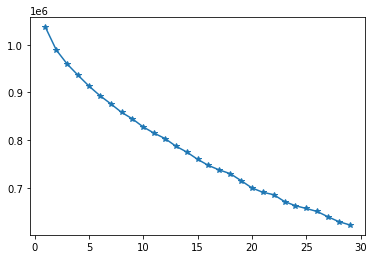

In [16]:
a=[]
for i in range(1,30): #max :30
    kmeans_em=KMeans(i)
    kmeans_em.fit(x_scaled)
    a.append(kmeans_em.inertia_) # 
plt.plot(range(1,30),a,marker = '*')

## silhouette_score
The Silhouette score is used to measure the degree of separation between clusters. It calcualte the average distance between points in the cluster to centre point in cluster and distance between centre point and point outside the cluster.

In [17]:
from sklearn.metrics import silhouette_score

In [18]:
for i in range(3,10):
    kmeans = KMeans(n_clusters=i, max_iter=50)
    kmeans.fit(x_scaled)
    cluster_labels = kmeans.labels_
    silhouette_avg = silhouette_score(x_scaled, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(i, silhouette_avg))

For n_clusters=3, the silhouette score is 0.2231234885486386
For n_clusters=4, the silhouette score is 0.07101239338774333
For n_clusters=5, the silhouette score is 0.06926116483421024
For n_clusters=6, the silhouette score is 0.06764250214579381
For n_clusters=7, the silhouette score is 0.07181103620134706
For n_clusters=8, the silhouette score is 0.07001162302881907
For n_clusters=9, the silhouette score is 0.020260337984518824


In [20]:
pip install yellowbrick

     |████████████████████████████████| 271 kB 1.3 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


### Number of cluster:

In [21]:
Km_cluster_em=KMeans(6) # Based on elbow method.
Km_cluster_em.fit(x_scaled)



KMeans(n_clusters=6)

#### Create a new dataframe with K = 6

In [22]:
my_Cluster_new=mydata.copy()
my_Cluster_new['KM_Elbow']=Km_cluster_em.predict(x_scaled)
my_Cluster_new

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft,KM_Elbow
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,5
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
5,6,0,4,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,29997,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29997,29998,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29998,29999,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Check the centroid values by averaging the features in each cluster.

In [23]:
my_Cluster_new.groupby('KM_Elbow').mean() # group

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
KM_Elbow,,,,,,,,,,,,,,,,,,,,,
0,13819.834940,0.994054,4.283371,0.296289,0.445766,0.197252,0.009432,0.030347,0.084273,0.005946,...,0.032602,0.126512,0.065409,0.065614,0.017429,0.010662,0.160960,0.085708,0.058233,0.042034
1,16263.939512,0.118049,4.188293,0.680000,0.622439,0.478049,0.313171,0.229268,0.287805,0.269268,...,0.840000,0.695610,0.574634,0.720000,0.144390,0.127805,1.086829,0.493659,0.744390,0.848780
2,17663.075359,0.096890,4.192584,0.349282,0.400718,0.309809,0.187799,0.255981,0.242823,0.279904,...,0.196172,0.665072,0.872010,0.382775,1.569378,1.188995,0.202153,0.143541,0.098086,0.072967
3,12905.736111,0.228175,4.625000,0.168651,0.301587,0.115079,0.123016,0.095238,0.158730,0.055556,...,0.049603,0.182540,0.305556,0.140873,0.011905,0.011905,0.174603,0.128968,0.051587,0.037698
4,14656.940314,0.000000,4.112613,0.127854,0.112486,0.136080,0.091761,0.074927,0.096480,0.060388,...,0.062747,0.163627,0.261574,0.084874,0.020087,0.014730,0.142648,0.089593,0.059431,0.038388
5,17157.142463,0.013097,4.656250,0.695772,0.483686,0.528952,0.590533,0.506204,0.315947,0.333640,...,0.139706,0.666131,1.007353,0.364890,0.058824,0.034237,0.204963,0.178539,0.088235,0.042969


/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:369: UserWarning: Defa

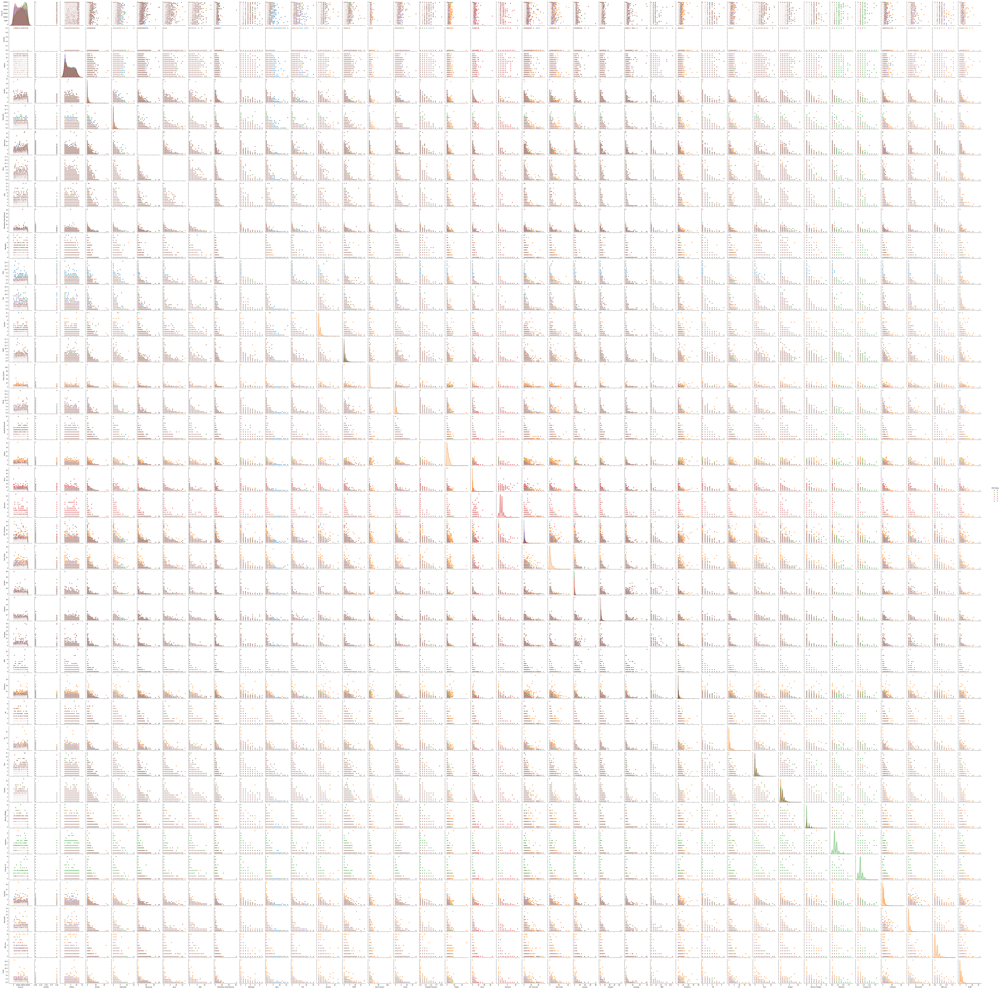

In [24]:
sns.pairplot(data=my_Cluster_new,hue='KM_Elbow')

## 3D Graph for clustering

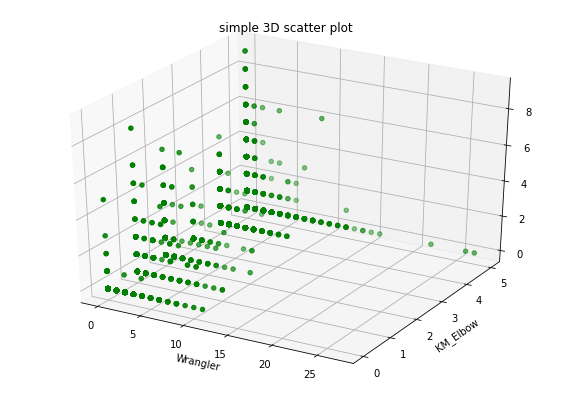

In [25]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt

z = my_Cluster_new['Wrangler']
x = my_Cluster_new['Samsung']
y = my_Cluster_new['KM_Elbow']
 
 # Creating figure
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
# Creating plot
ax.scatter3D(x, y, z, color = "green")
plt.title("simple 3D scatter plot")
plt.xlabel('Samsung')
plt.ylabel('KM_Elbow')
plt.xlabel('Wrangler')
# show plot
plt.show()

In [54]:
import plotly.express as px
px.scatter_3d (data_frame = my_Cluster_new, x = 'Samsung',y = 'KM_Elbow',z= 'Wrangler')

### count categorical values:

In [26]:
my_Cluster_new['KM_Elbow'].value_counts()

4    15682
0     4877
5     4352
1     1025
2      836
3      504
Name: KM_Elbow, dtype: int64

In [27]:
my_Cluster_new.head()

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft,KM_Elbow
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,5
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
5,6,0,4,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,4


## statistical summary

In [28]:
my_Cluster_new.describe()

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft,KM_Elbow
count,27276.000000,27276.00000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,...,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000,27276.000000
mean,15026.349795,0.19145,4.244647,0.276873,0.262795,0.227489,0.168463,0.147492,0.142140,0.108740,...,0.272877,0.376778,0.160141,0.077797,0.057303,0.193760,0.120656,0.090592,0.071271,3.251833
std,8655.855928,0.39345,3.580825,0.817612,0.719259,0.925124,0.757750,0.656230,0.530013,0.519941,...,0.716391,0.760309,0.507343,0.384146,0.299185,0.628296,0.457624,0.405152,0.387592,1.714650
min,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7557.750000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
50%,15065.500000,0.00000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,22537.250000,0.00000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
max,30000.000000,1.00000,12.000000,24.000000,15.000000,27.000000,17.000000,14.000000,31.000000,9.000000,...,12.000000,11.000000,8.000000,9.000000,8.000000,22.000000,14.000000,8.000000,16.000000,5.000000


### Correlation:
   It is used to check relation between variables.If statistical value < 0.05 no Autocorrelation if value > 0.05 it has high autocorrelation 

In [56]:
my_Cluster_new_corr = my_Cluster_new.corr()
my_Cluster_new_corr

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft,KM_Elbow
Cust_ID,1.000000,-0.065931,0.022437,0.060953,0.021677,0.056866,0.048642,0.060692,0.034219,0.039404,...,0.062598,0.051840,0.021411,0.079315,0.048070,0.003216,-0.006147,-0.021673,0.018419,0.063399
Gender,-0.065931,1.000000,0.007767,0.023041,0.125629,-0.009161,-0.102281,-0.083667,-0.049625,-0.093346,...,-0.079602,-0.195062,-0.072046,-0.042999,-0.050219,-0.000862,-0.015285,-0.018417,-0.005332,-0.873241
Orders,0.022437,0.007767,1.000000,0.009460,0.031608,0.012108,0.012807,0.005052,0.004260,-0.002218,...,0.006762,0.015578,0.004811,-0.000457,-0.003504,0.005378,0.012168,0.009388,-0.007967,0.006596
Jordan,0.060953,0.023041,0.009460,1.000000,0.176335,0.070817,0.117573,0.133464,0.020776,0.041294,...,0.059792,0.060782,0.065461,0.024102,0.023718,0.014968,0.013014,0.017802,0.019756,0.003613
Gatorade,0.021677,0.125629,0.031608,0.176335,1.000000,0.065919,0.045438,0.056299,0.028674,0.088092,...,0.054719,0.044266,0.057783,0.053257,0.032585,0.019157,0.012714,0.036314,0.019086,-0.117848
Samsung,0.056866,-0.009161,0.012108,0.070817,0.065919,1.000000,0.011594,0.028252,0.033799,0.013512,...,0.015866,0.047126,0.018851,0.023756,0.019265,0.006795,0.003060,0.007715,0.009280,0.024278
Asus,0.048642,-0.102281,0.012807,0.117573,0.045438,0.011594,1.000000,0.115779,0.017059,0.023947,...,0.029051,0.043383,0.040833,0.014676,0.012565,0.010140,0.018776,0.007133,0.008927,0.126555
Udis,0.060692,-0.083667,0.005052,0.133464,0.056299,0.028252,0.115779,1.000000,0.039548,0.022838,...,0.028950,0.068282,0.024420,0.032582,0.037809,0.001112,0.011061,0.005040,0.009409,0.112085
Mondelez International,0.034219,-0.049625,0.004260,0.020776,0.028674,0.033799,0.017059,0.039548,1.000000,0.020544,...,0.034381,0.098828,0.055103,0.037344,0.045048,0.015721,0.012579,0.025913,0.022074,0.050859
Wrangler,0.039404,-0.093346,-0.002218,0.041294,0.088092,0.013512,0.023947,0.022838,0.020544,1.000000,...,0.056858,0.102435,0.042951,0.074573,0.063410,0.006320,0.005414,0.015195,0.015939,0.091752


### Display the correlation:

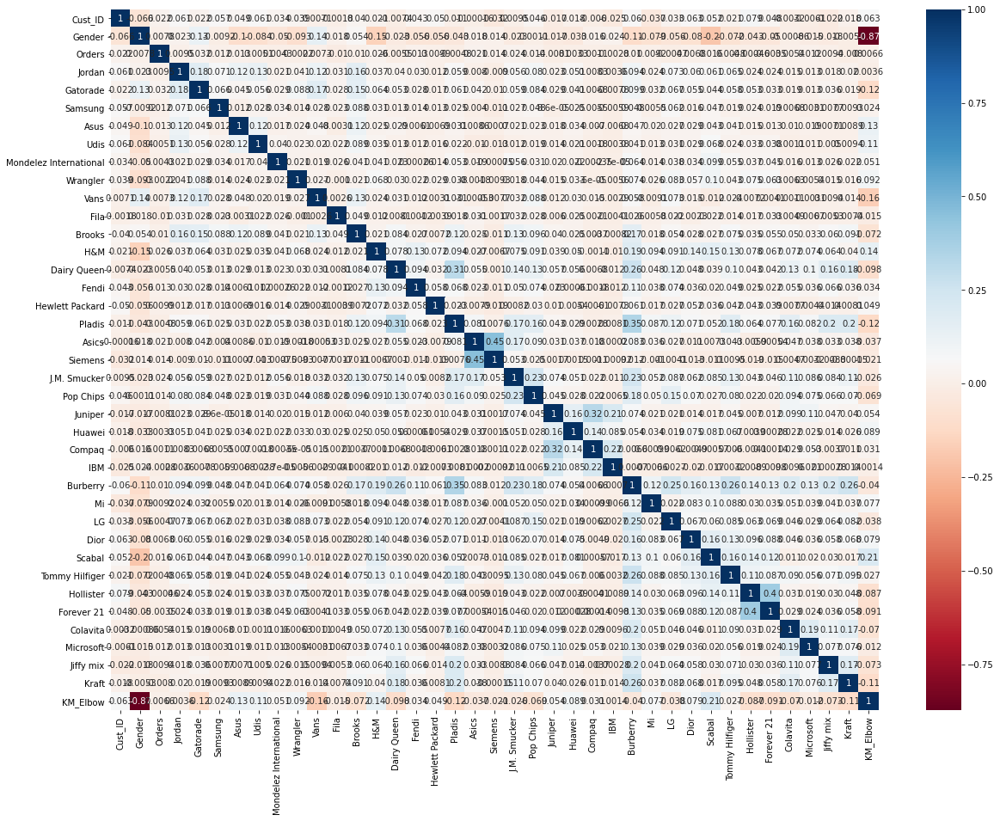

In [58]:
plt.figure(figsize =(20,15))
sns.heatmap(my_Cluster_new_corr,annot = True,cmap = 'RdBu')

### Boxplot: to check outlier:

In [29]:
my_Cluster_new_1 = my_Cluster_new[['Jordan', 'Gatorade', 'Samsung', 'Asus',
       'Udis', 'Mondelez International', 'Wrangler', 'Vans', 'Fila', 'Brooks',
       'H&M', 'Dairy Queen', 'Fendi', 'Hewlett Packard', 'Pladis', 'Asics',
       'Siemens', 'J.M. Smucker', 'Pop Chips', 'Juniper', 'Huawei', 'Compaq',
       'IBM', 'Burberry', 'Mi', 'LG', 'Dior', 'Scabal', 'Tommy Hilfiger',
       'Hollister', 'Forever 21', 'Colavita', 'Microsoft', 'Jiffy mix',]]

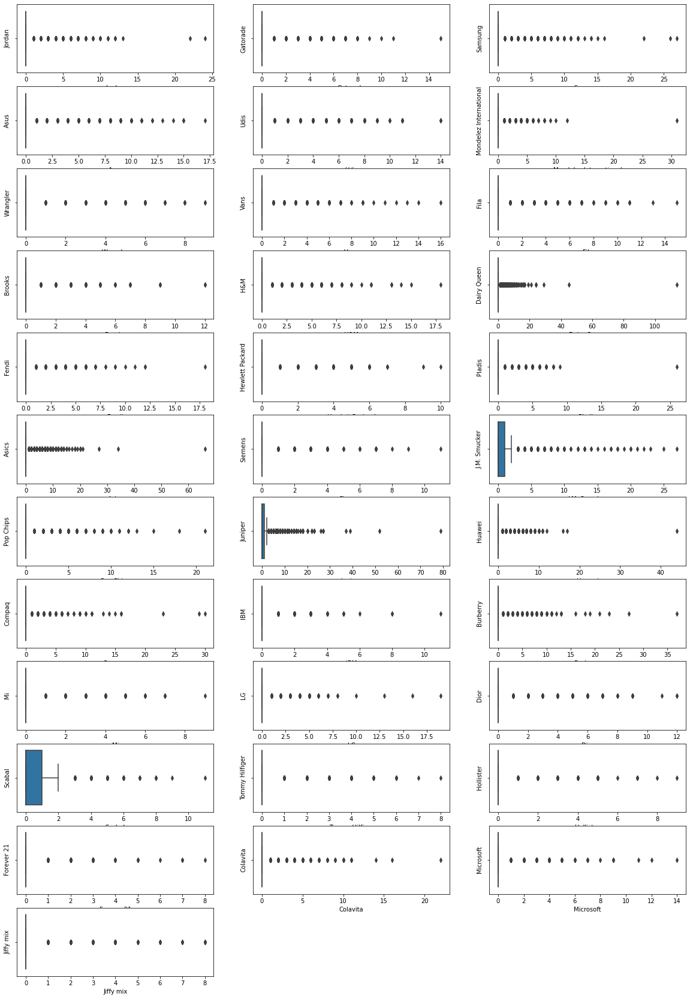

In [30]:
plt.figure(figsize=(20,50))
for i,col in enumerate(my_Cluster_new_1,1):
    plt.subplot(20,3,i)
    sns.boxplot(my_Cluster_new_1[col])
    plt.ylabel(col)
plt.show()

### Use Zscore to remove outlier:

In [47]:
from scipy.stats import zscore
my_Cluster_new_1 = my_Cluster_new_1.apply(zscore)
my_Cluster_new_1.head()



,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,Vans,Fila,Brooks,...,Mi,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix
0,-0.338643,-0.365376,-0.245906,-0.222324,-0.224761,-0.268186,-0.209144,3.405184,-0.178306,-0.303428,...,-0.255891,-0.208677,-0.380912,-0.495568,-0.315652,-0.202524,-0.191534,-0.308395,-0.263661,-0.223605
1,-0.338643,1.024969,-0.245906,-0.222324,-0.224761,-0.268186,-0.209144,-0.206357,-0.178306,-0.303428,...,8.100495,-0.208677,1.014999,-0.495568,-0.315652,-0.202524,-0.191534,-0.308395,-0.263661,-0.223605
2,-0.338643,1.024969,-0.245906,-0.222324,-0.224761,-0.268186,-0.209144,-0.206357,-0.178306,-0.303428,...,-0.255891,-0.208677,-0.380912,-0.495568,-0.315652,-0.202524,-0.191534,-0.308395,1.921579,-0.223605
3,-0.338643,-0.365376,-0.245906,-0.222324,-0.224761,-0.268186,-0.209144,-0.206357,-0.178306,-0.303428,...,-0.255891,-0.208677,-0.380912,-0.495568,-0.315652,-0.202524,-0.191534,-0.308395,-0.263661,-0.223605
5,-0.338643,-0.365376,-0.245906,-0.222324,-0.224761,-0.268186,-0.209144,-0.206357,-0.178306,-0.303428,...,1.833206,-0.208677,-0.380912,0.819711,-0.315652,-0.202524,-0.191534,-0.308395,-0.263661,2.244648


## Scatter plot: continous variable:

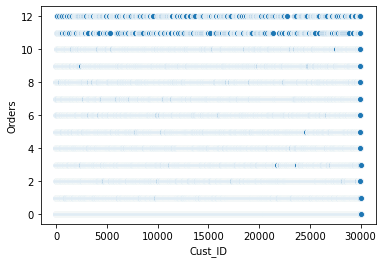

In [50]:
sns.scatterplot(x='Cust_ID',y ='Orders',data = my_Cluster_new)

In [32]:
my_Cluster_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27276 entries, 0 to 29999
Data columns (total 39 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Cust_ID                 27276 non-null  int64
 1   Gender                  27276 non-null  int64
 2   Orders                  27276 non-null  int64
 3   Jordan                  27276 non-null  int64
 4   Gatorade                27276 non-null  int64
 5   Samsung                 27276 non-null  int64
 6   Asus                    27276 non-null  int64
 7   Udis                    27276 non-null  int64
 8   Mondelez International  27276 non-null  int64
 9   Wrangler                27276 non-null  int64
 10  Vans                    27276 non-null  int64
 11  Fila                    27276 non-null  int64
 12  Brooks                  27276 non-null  int64
 13  H&M                     27276 non-null  int64
 14  Dairy Queen             27276 non-null  int64
 15  Fendi              

## check Null Value:

In [33]:
my_Cluster_new.isnull().sum()

Cust_ID                   0
Gender                    0
Orders                    0
Jordan                    0
Gatorade                  0
Samsung                   0
Asus                      0
Udis                      0
Mondelez International    0
Wrangler                  0
Vans                      0
Fila                      0
Brooks                    0
H&M                       0
Dairy Queen               0
Fendi                     0
Hewlett Packard           0
Pladis                    0
Asics                     0
Siemens                   0
J.M. Smucker              0
Pop Chips                 0
Juniper                   0
Huawei                    0
Compaq                    0
IBM                       0
Burberry                  0
Mi                        0
LG                        0
Dior                      0
Scabal                    0
Tommy Hilfiger            0
Hollister                 0
Forever 21                0
Colavita                  0
Microsoft           

### Separate independent and dependent variable:

In [34]:
x_ind = my_Cluster_new.drop('KM_Elbow', axis = 1)
x_ind.head()

,Cust_ID,Gender,Orders,Jordan,Gatorade,Samsung,Asus,Udis,Mondelez International,Wrangler,...,LG,Dior,Scabal,Tommy Hilfiger,Hollister,Forever 21,Colavita,Microsoft,Jiffy mix,Kraft
0,1,1,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,3,1,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,0,4,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


In [35]:
y_dep = my_Cluster_new['KM_Elbow']
y_dep.head()

0    0
1    5
2    0
3    4
5    4
Name: KM_Elbow, dtype: int32

## RandomForestClassifier

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

In [37]:
x_train,x_test,y_train,y_test=train_test_split(x_ind,y_dep,train_size=0.8,random_state=2)

In [38]:

model_rf=RandomForestClassifier(random_state=2)
model_rf=model_rf.fit(x_train,y_train)

In [39]:
y_pred=model_rf.predict(x_test)
y_pred

array([5, 0, 4, ..., 4, 5, 0], dtype=int32)

## Performance Measures 

In [40]:
from sklearn.metrics import confusion_matrix,accuracy_score

In [41]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[ 982,    0,    0,    0,    1,    0],
       [  11,  136,    6,    1,   25,   45],
       [   0,    0,  156,    0,    1,    4],
       [   0,    0,    0,   90,    9,    9],
       [   0,    3,    0,    0, 3079,   29],
       [   9,    2,    1,    1,  238,  618]])

### Accuracy score:

In [42]:
accuracy_score(y_test,y_pred)

0.9276026392961877

# Conclusion:
   One of the main application for k means is customer segmentation.Hence we have used K MEAN clustering to group customer based on their similarities in buying these brands.So we grouped into 6 groups based on their similarities.Then after grouping the dataset, we performed a classsifer called RandomForest classifer,Our accuracy for this dataset after grouping by k means and building a model using RandomForest is **93%**. So our prediction using the given dataset and group formed by is 96%.We have Elbow method and sillouhette method to find optimum value for k.It will to  analyze the trend in the market to increase their sales.